# 07wk-1: 합성곱신경망 (3) – XAI (Class Activation Map, CAM)

최규빈  
2024-04-14

# 1. 강의영상

In [1]:
#{{<video https://youtu.be/playlist?list=PLQqh36zP38-wTzMRmZzvr2TL12DNo6jXF&si=RnG6_-uhn9Yb57nU >}}

# 2. Imports

In [1]:
import torch 
import torchvision
import fastai.vision

# 3. XAI란?

> https://brunch.co.kr/(**hvnpoet/140?**)

# 4. CAM의 구현을 위한 예비학습

## A. Data

In [3]:
path = untar_data(URLs.PETS)/'images'

In [4]:
path.ls()

In [5]:
files= get_image_files(path)
def label_func(fname):
    if fname[0].isupper():
        return 'cat'
    else:
        return 'dog'
dls = ImageDataLoaders.from_name_func(path,files,label_func,item_tfms=Resize(512)) 

## B. 이미지 자료 처리

`-` 원래 우리가 아는 방법: path를 의미하는 string $\to$ torch.tensor

In [134]:
torchvision.io.read_image('/home/cgb3/.fastai/data/oxford-iiit-pet/images/staffordshire_bull_terrier_106.jpg')

`-` fastai를 이용하는 방법

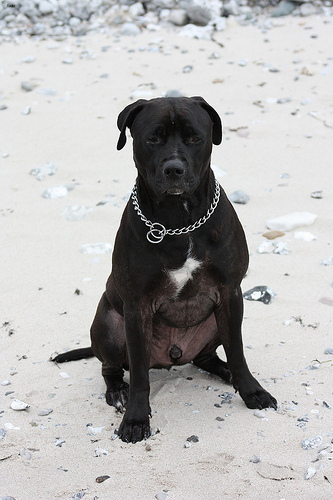

In [148]:
ximg = PILImage.create('/home/cgb3/.fastai/data/oxford-iiit-pet/images/staffordshire_bull_terrier_106.jpg')
ximg

In [149]:
TensorImage(ximg)

`-` fastai를 이용하는 방법2:

In [156]:
iter(dls.test_dl([ximg])).__next__()[0]

In [157]:
first(dls.test_dl([ximg]))[0]

In [158]:
x.to("cpu").shape

In [167]:
torch.einsum('ocij -> ijc',x.to("cpu")).shape

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).

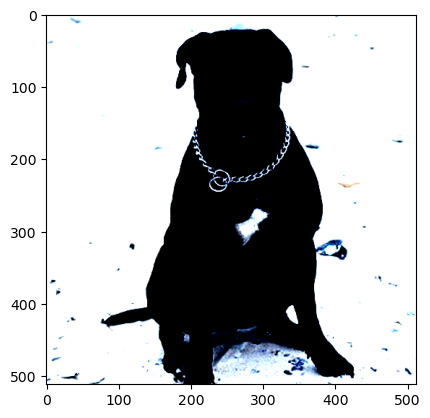

In [168]:
plt.imshow(torch.einsum('ocij -> ijc',x.to("cpu")))

In [171]:
dls.decode([x])

## C. AP layer

In [11]:
ap = torch.nn.AdaptiveAvgPool2d(output_size=1) 

In [12]:
X = torch.arange(48).reshape(1,3,4,4)*1.0 
X

In [13]:
ap(X)

In [14]:
X[0,0,...].mean(),X[0,1,...].mean(),X[0,2,...].mean()

# 6. CAM의 구현

## A. 1단계 – 이미지분류 잘하는 네트워크 선택

In [15]:
lrnr = vision_learner(dls,resnet34,metrics=accuracy) 

In [17]:
lrnr.fine_tune(1)

## B. 2단계– 네트워크의 끝 부분 수정

`-` 모형의 분해

In [18]:
net1= lrnr.model[0]
net2= lrnr.model[1]

`-` net2를 좀더 살펴보자.

In [19]:
net2

In [20]:
_X, _y = dls.one_batch() 

In [21]:
net1.to("cpu")
net2.to("cpu") 
_X = _X.to("cpu")

In [22]:
print(net1(_X).shape)
print(net2[0](net1(_X)).shape)
print(net2[1](net2[0](net1(_X))).shape)
print(net2[2](net2[1](net2[0](net1(_X)))).shape)

torch.Size([64, 512, 16, 16])
torch.Size([64, 1024, 1, 1])
torch.Size([64, 1024])
torch.Size([64, 1024])

`-` net2를 아래와 같이 수정하고 재학습하자 (왜?)

In [23]:
net2= torch.nn.Sequential(
    torch.nn.AdaptiveAvgPool2d(output_size=1), # (64,512,16,16) -> (64,512,1,1) 
    torch.nn.Flatten(), # (64,512,1,1) -> (64,512) 
    torch.nn.Linear(512,2,bias=False) # (64,512) -> (64,2) 
)

In [24]:
net = torch.nn.Sequential(
    net1,
    net2
)

In [25]:
lrnr2= Learner(dls,net,metrics=accuracy) # loss_fn??

In [26]:
lrnr2.loss_func, lrnr.loss_func ## 알아서 기존의 loss function으로 잘 들어가 있음. 

In [27]:
lrnr2.fine_tune(5) # net2를 수정해서 accuracy가 안좋아지긴 했는데 그래도 쓸만함 

## C. 3단계– 수정된 net2에서 Linear와 AP의 순서를 바꿈

`-` 1개의 observation을 고정하였을 경우 출력과정 상상

In [48]:
ximg = PILImage.create('/home/cgb3/.fastai/data/oxford-iiit-pet/images/staffordshire_bull_terrier_106.jpg')
x = first(dls.test_dl([ximg]))[0]

In [49]:
net2

In [50]:
print(net1(x).shape)
print(net2[0](net1(x)).shape)
print(net2[1](net2[0](net1(x))).shape)
print(net2[2](net2[1](net2[0](net1(x)))).shape)

torch.Size([1, 512, 16, 16])
torch.Size([1, 512, 1, 1])
torch.Size([1, 512])
torch.Size([1, 2])

`-` 최종결과 확인

In [51]:
net(x)

In [52]:
dls.vocab

-   net(x)에서 뒤쪽의 값이 클수록 ’dog’를 의미한다.

`-` net2의 순서 바꾸기 전 전체 네트워크:

$$\underset{(1,3,512,512)}{\boldsymbol x} \overset{net_1}{\to} \left( \underset{(1,512,16,16)}{\tilde{\boldsymbol x}} \overset{ap}{\to} \underset{(1,512,1,1)}{{\boldsymbol \sharp}}\overset{flatten}{\to} \underset{(1,512)}{{\boldsymbol \sharp}}\overset{linear}{\to} \underset{(1,2)}{\hat{\boldsymbol y}}\right) = [-9.0358,  9.0926]$$

`-` 아래와 같이 순서를 바꿔서 한번 계산해보고 싶다. (왜???..)

$$\underset{(1,3,224,224)}{\boldsymbol x} \overset{net_1}{\to} \left( \underset{(1,512,16,16)}{\tilde{\boldsymbol x}} \overset{linear}{\to} \underset{(1,2,16,16)}{{\bf why}}\overset{ap}{\to} \underset{(1,2,1,1)}{{\boldsymbol \sharp}}\overset{flatten}{\to} \underset{(1,2)}{\hat{\boldsymbol y}}\right) = [−9.0358,9.0926]$$

-   여기에서 (1,512,16,16) -\> (1,2,16,16) 로 가는 선형변환을 적용하는
    방법? **(16,16) each pixel에 대하여 (512 $\to$ 2)로 가는 변환을
    수행**

`-` 통찰: 이 경우 특이하게도 레이어의 순서를 바꿨을때 출력이 동일함
(선형변환하고 평균내거나 평균내고 선형변환하는건 같으니까)

In [53]:
_x =torch.tensor([1,2,3.14,4]).reshape(4,1)
_x 

In [54]:
_l1 = torch.nn.Linear(1,1,bias=False)
_l1(_x).mean() # _x -> 선형변환 -> 평균 

In [55]:
_l1(_x.mean().reshape(1,1)) # _x -> 평균 -> 선형변환

`-` 구현해보자.

In [56]:
why = torch.einsum('cb,abij->acij',net2[2].weight,net1(x))

In [57]:
net2[0](why)

In [58]:
net(x)

### 잠깐 멈추고 생각 좀 해보자..

`-` 이미지

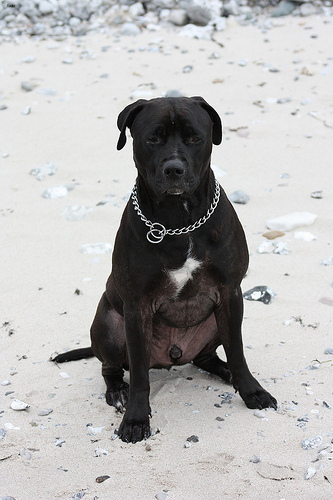

In [59]:
ximg

`-` 네트워크의 결과

In [60]:
net2(net1(x))

-   -9.0358 \<\< 9.0926 이므로 ’ximg’는 높은 확률로 개라는 뜻이다.

`-` 아래의네트워크를 관찰

$$\underset{(1,2,16,16)}{{\bf why}}\overset{ap}{\to} \underset{(1,2,1,1)}{{\boldsymbol \sharp}}\overset{flatten}{\to} \underset{(1,2)}{\hat{\boldsymbol y}} = [-9.0358,9.0926]$$

In [61]:
net2[0](why)

더 파고들어서 분석해보자.

In [62]:
why.shape

In [63]:
(why[0,0,:,:]).mean(), (why[0,1,:,:]).mean()

***`why[0,0,:,:]`***

In [64]:
#collapse_output
(why[0,0,:,:]).to(torch.int64)

-   이 값들의 평균은 -9.0358 이다. (이 값이 클수록 이 그림이 고양이라는
    의미 = 이 값이 작을수록 이 그림이 고양이가 아니라는 의미)
-   그런데 살펴보니 대부분의 위치에서 0에 가까운 값을 가짐. 다만
    특정위치에서 엄청 큰 작은값이 있어서 -9.0358이라는 평균값이 나옴
    $\to$ 특정위치에 존재하는 엄청 작은 값들은 ximg가 고양이가 아니라고
    판단하는 근거가 된다.

***`why[0,1,:,:]`***

In [65]:
#collapse_output
(why[0,1,:,:]).to(torch.int64)

-   이 값들의 평균은 9.0926 이다. (이 값이 클수록 이 그림이 강아지라는
    의미)
-   그런데 살펴보니 대부분의 위치에서 0에 가까운 값을 가짐. 다만
    특정위치에서 엄청 큰 값들이 있어서 9.0926이라는 평균값이 나옴 $\to$
    특정위치에 존재하는 엄청 큰 값들은 결국 ximg를 강아지라고 판단하는
    근거가 된다.

`-` 시각화

In [66]:
why_cat = why[0,0,:,:]
why_dog = why[0,1,:,:]

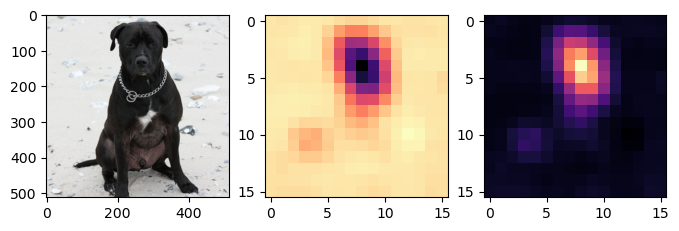

In [67]:
fig, ax = plt.subplots(1,3,figsize=(8,4))
ax[0].imshow(torch.einsum('ocij -> ijc',dls.decode((x,))[0]).to("cpu"))
ax[1].imshow(why_cat.to("cpu").detach(),cmap='magma')
ax[2].imshow(why_dog.to("cpu").detach(),cmap='magma')

-   magma = 검은색 \< 보라색 \< 빨간색 \< 노란색
-   왼쪽그림의 검은 부분은 고양이가 아니라는 근거, 오른쪽그림의
    노란부분은 강아지라는 근거

`-` why_cat, why_dog를 (16,16) $\to$ (512,512) 로 resize

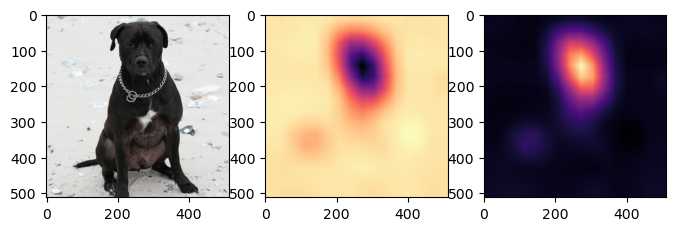

In [68]:
fig, ax = plt.subplots(1,3,figsize=(8,4))
ax[0].imshow(torch.einsum('ocij -> ijc',dls.decode((x,))[0]).to("cpu"))
ax[1].imshow(why_cat.to("cpu").detach(),cmap='magma',extent=(0,511,511,0),interpolation='bilinear')
ax[2].imshow(why_dog.to("cpu").detach(),cmap='magma',extent=(0,511,511,0),interpolation='bilinear')

`-` 겹쳐그리기

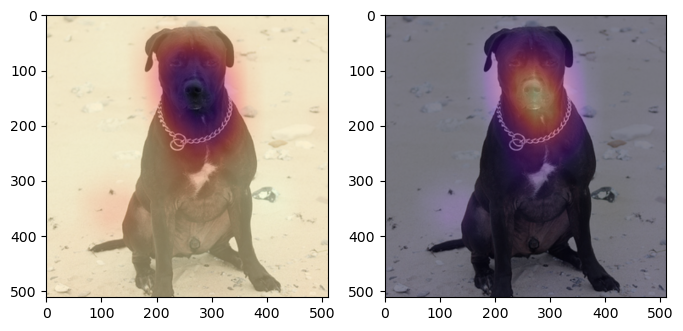

In [70]:
fig, ax = plt.subplots(1,2,figsize=(8,4))
ax[0].imshow(torch.einsum('ocij -> ijc',dls.decode((x,))[0]).to("cpu"))
ax[0].imshow(why_cat.to("cpu").detach(),cmap='magma',extent=(0,511,511,0),interpolation='bilinear',alpha=0.5)
ax[1].imshow(torch.einsum('ocij -> ijc',dls.decode((x,))[0]).to("cpu"))
ax[1].imshow(why_dog.to("cpu").detach(),cmap='magma',extent=(0,511,511,0),interpolation='bilinear',alpha=0.5)

`-` 하니이미지 시각화

In [ ]:
import requests

In [ ]:
ximg= PILImage.create(requests.get('https://github.com/guebin/DL2022/blob/main/posts/I.%20Overview/2022-09-06-hani01.jpeg?raw=true').content)
x= first(dls.test_dl([ximg]))[0]

In [80]:
x.shape

In [86]:
#plt.imshow(torch.einsum('ocij -> ijc',x.to("cpu")))

In [87]:
why = torch.einsum('cb,abij->acij',net2[2].weight,net1(x))
why_cat = why[0,0,:,:]
why_dog = why[0,1,:,:]

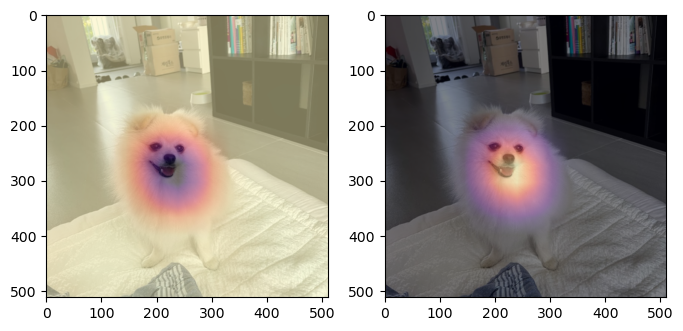

In [96]:
fig, ax = plt.subplots(1,2,figsize=(8,4))
ax[0].imshow(torch.einsum('ocij -> ijc',dls.decode((x,))[0]).to("cpu"))
ax[0].imshow(why_cat.to("cpu").detach(),cmap='magma',extent=(0,511,511,0),interpolation='bilinear',alpha=0.5)
ax[1].imshow(torch.einsum('ocij -> ijc',dls.decode((x,))[0]).to("cpu"))
ax[1].imshow(why_dog.to("cpu").detach(),cmap='magma',extent=(0,511,511,0),interpolation='bilinear',alpha=0.5)

`-` 하니이미지 시각화 with prob

In [97]:
sftmax=torch.nn.Softmax(dim=1)

In [98]:
sftmax(net(x))

In [99]:
catprob, dogprob = sftmax(net(x))[0,0].item(), sftmax(net(x))[0,1].item()

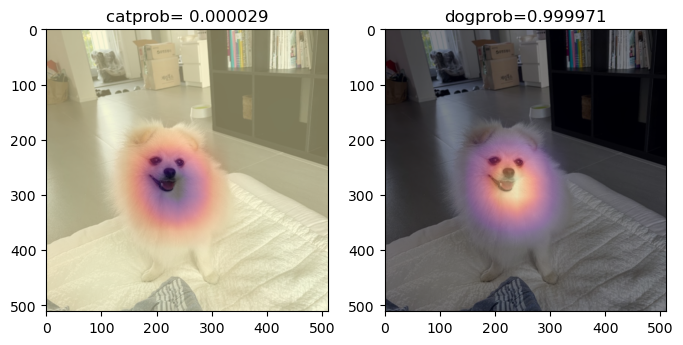

In [103]:
fig, ax = plt.subplots(1,2,figsize=(8,4))
ax[0].imshow(torch.einsum('ocij -> ijc',dls.decode((x,))[0]).to("cpu"))
ax[0].imshow(why_cat.to("cpu").detach(),cmap='magma',extent=(0,511,511,0),interpolation='bilinear',alpha=0.5)
ax[0].set_title(f'catprob= {catprob:.6f}') 
ax[1].imshow(torch.einsum('ocij -> ijc',dls.decode((x,))[0]).to("cpu"))
ax[1].imshow(why_dog.to("cpu").detach(),cmap='magma',extent=(0,511,511,0),interpolation='bilinear',alpha=0.5)
ax[1].set_title(f'dogprob={dogprob:.6f}')

## D. 4단계 – CAM 시각화

In [104]:
sftmax = torch.nn.Softmax(dim=1)

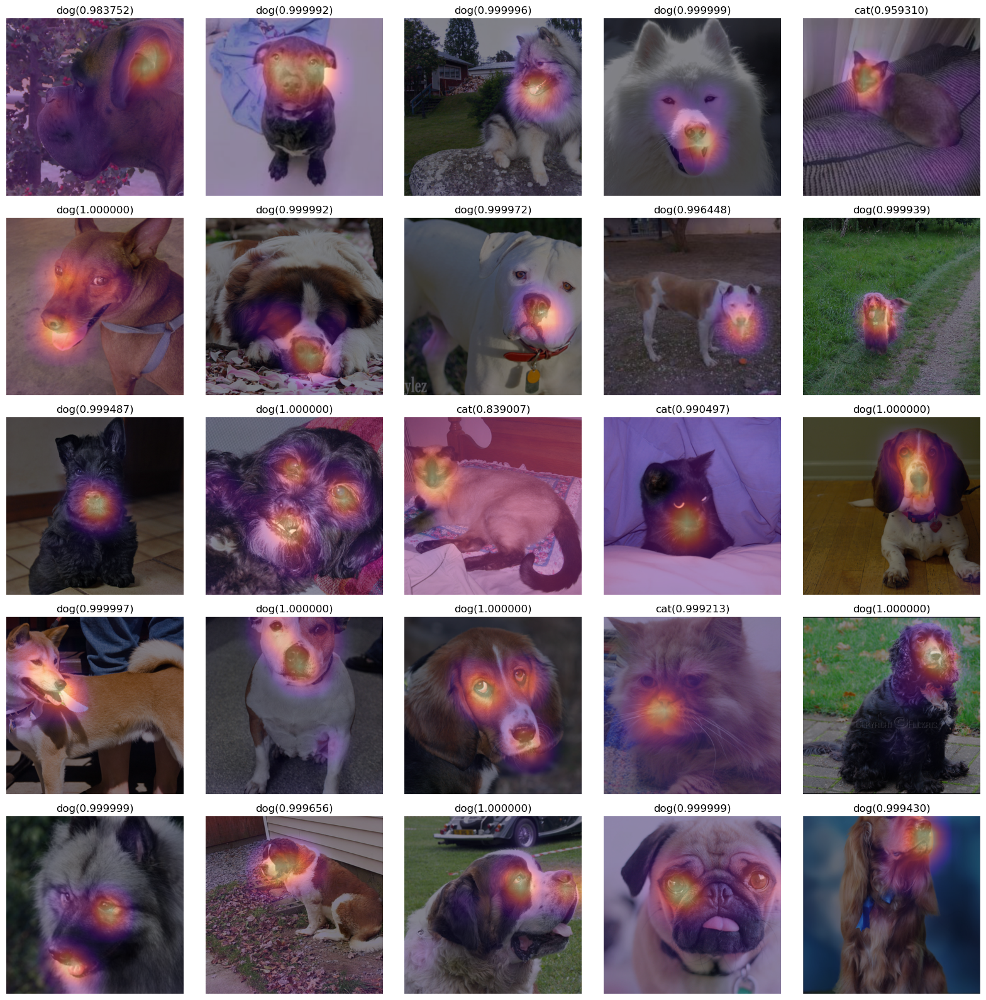

In [105]:
fig, ax = plt.subplots(5,5) 
k=0 
for i in range(5):
    for j in range(5): 
        x, = first(dls.test_dl([PILImage.create(get_image_files(path)[k])]))
        why = torch.einsum('cb,abij -> acij', net2[2].weight, net1(x))
        why_cat = why[0,0,:,:] 
        why_dog = why[0,1,:,:] 
        catprob, dogprob = sftmax(net(x))[0][0].item(), sftmax(net(x))[0][1].item()
        if catprob>dogprob: 
            dls.train.decode((x,))[0].squeeze().show(ax=ax[i][j])
            ax[i][j].imshow(why_cat.to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='magma')
            ax[i][j].set_title("cat(%2f)" % catprob)
        else: 
            dls.train.decode((x,))[0].squeeze().show(ax=ax[i][j])
            ax[i][j].imshow(why_dog.to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='magma')
            ax[i][j].set_title("dog(%2f)" % dogprob)
        k=k+1 
fig.set_figwidth(16)            
fig.set_figheight(16)
fig.tight_layout()

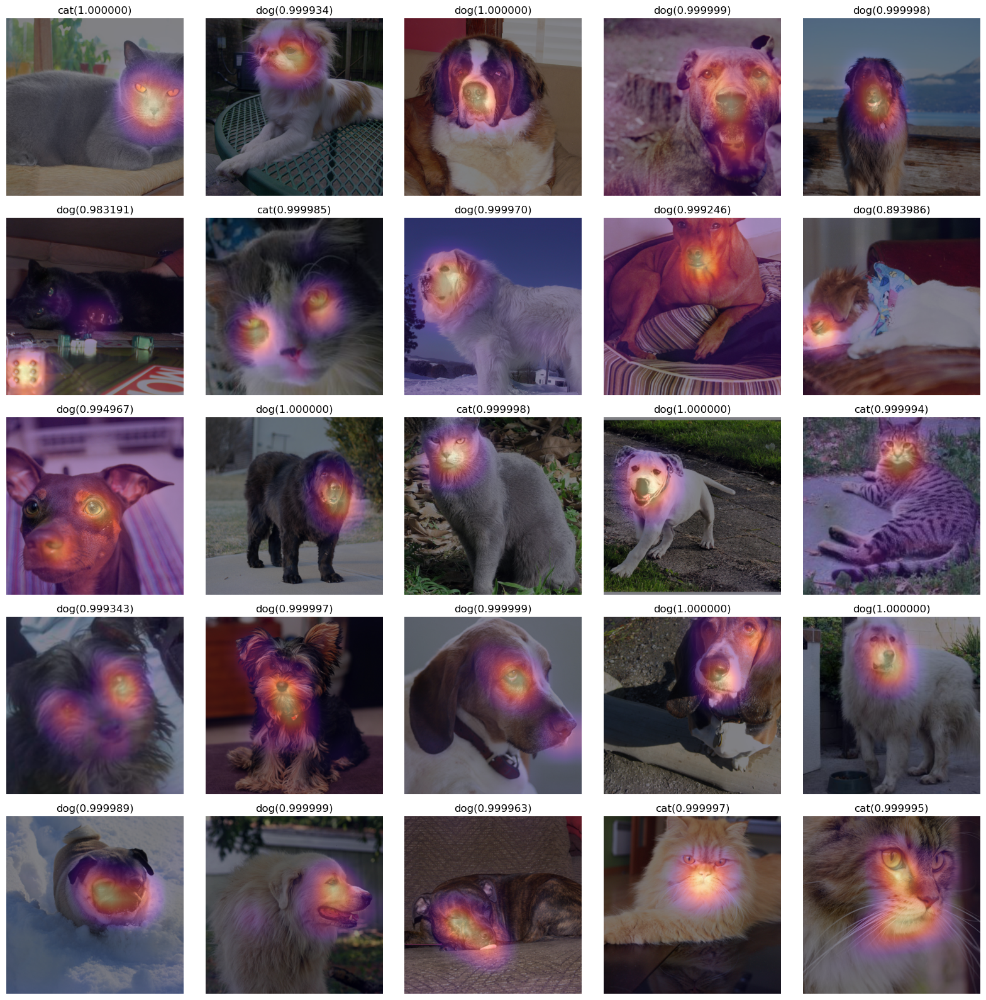

In [106]:
fig, ax = plt.subplots(5,5) 
k=25
for i in range(5):
    for j in range(5): 
        x, = first(dls.test_dl([PILImage.create(get_image_files(path)[k])]))
        why = torch.einsum('cb,abij -> acij', net2[2].weight, net1(x))
        why_cat = why[0,0,:,:] 
        why_dog = why[0,1,:,:] 
        catprob, dogprob = sftmax(net(x))[0][0].item(), sftmax(net(x))[0][1].item()
        if catprob>dogprob: 
            dls.train.decode((x,))[0].squeeze().show(ax=ax[i][j])
            ax[i][j].imshow(why_cat.to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='magma')
            ax[i][j].set_title("cat(%2f)" % catprob)
        else: 
            dls.train.decode((x,))[0].squeeze().show(ax=ax[i][j])
            ax[i][j].imshow(why_dog.to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='magma')
            ax[i][j].set_title("dog(%2f)" % dogprob)
        k=k+1 
fig.set_figwidth(16)            
fig.set_figheight(16)
fig.tight_layout()

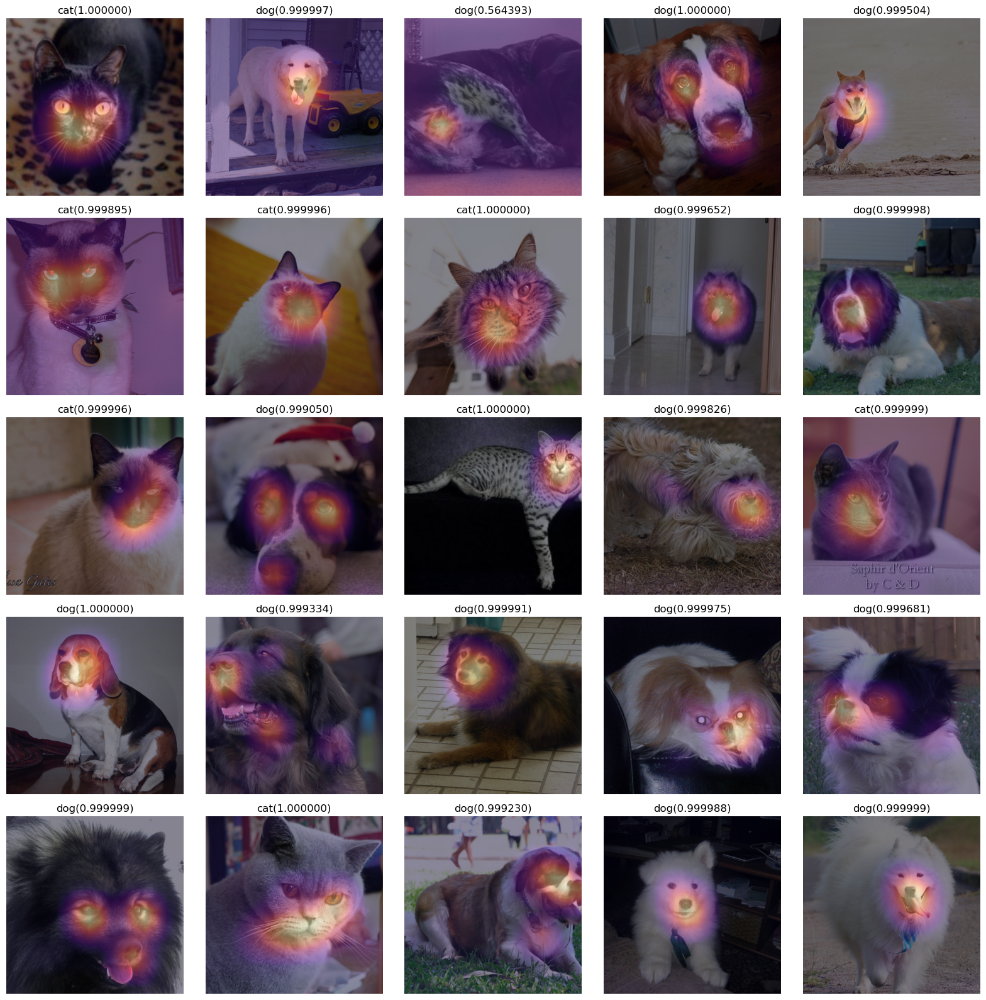

In [107]:
fig, ax = plt.subplots(5,5) 
k=50
for i in range(5):
    for j in range(5): 
        x, = first(dls.test_dl([PILImage.create(get_image_files(path)[k])]))
        why = torch.einsum('cb,abij -> acij', net2[2].weight, net1(x))
        why_cat = why[0,0,:,:] 
        why_dog = why[0,1,:,:] 
        catprob, dogprob = sftmax(net(x))[0][0].item(), sftmax(net(x))[0][1].item()
        if catprob>dogprob: 
            dls.train.decode((x,))[0].squeeze().show(ax=ax[i][j])
            ax[i][j].imshow(why_cat.to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='magma')
            ax[i][j].set_title("cat(%2f)" % catprob)
        else: 
            dls.train.decode((x,))[0].squeeze().show(ax=ax[i][j])
            ax[i][j].imshow(why_dog.to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='magma')
            ax[i][j].set_title("dog(%2f)" % dogprob)
        k=k+1 
fig.set_figwidth(16)            
fig.set_figheight(16)
fig.tight_layout()

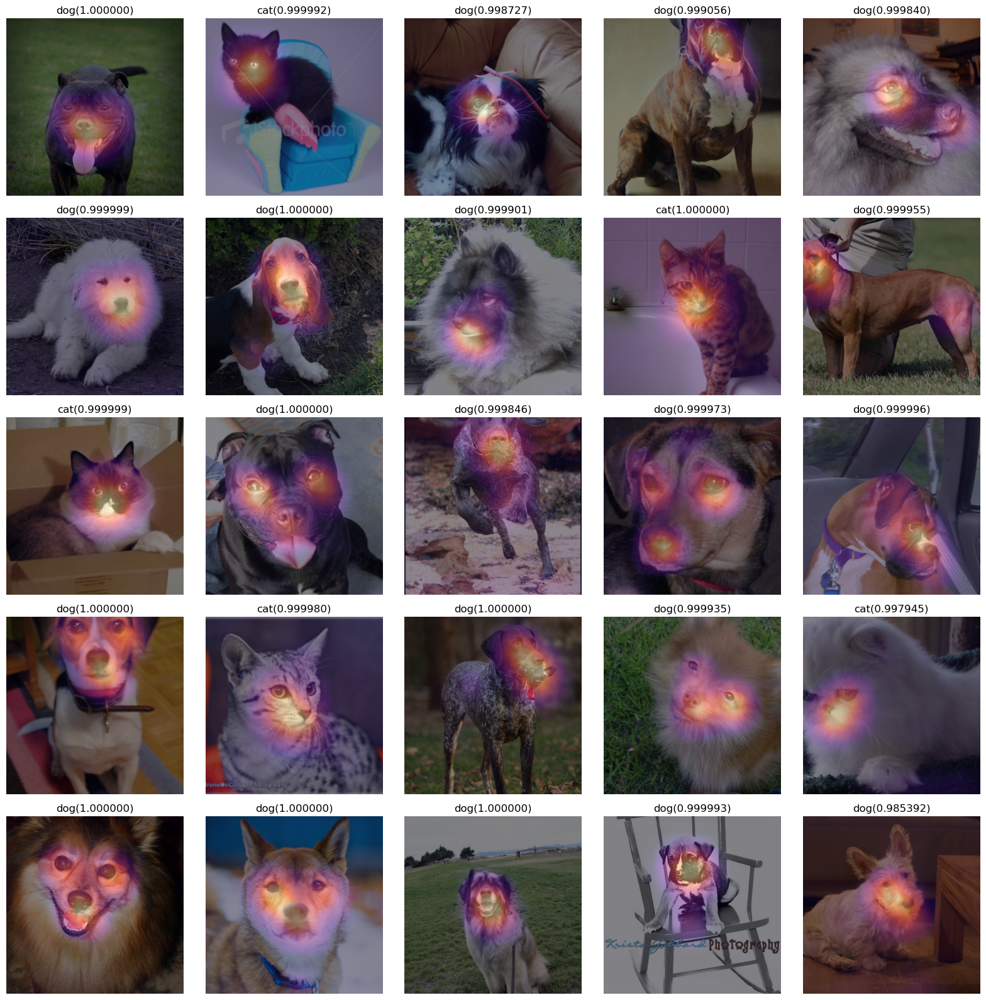

In [108]:
fig, ax = plt.subplots(5,5) 
k=75
for i in range(5):
    for j in range(5): 
        x, = first(dls.test_dl([PILImage.create(get_image_files(path)[k])]))
        why = torch.einsum('cb,abij -> acij', net2[2].weight, net1(x))
        why_cat = why[0,0,:,:] 
        why_dog = why[0,1,:,:] 
        catprob, dogprob = sftmax(net(x))[0][0].item(), sftmax(net(x))[0][1].item()
        if catprob>dogprob: 
            dls.train.decode((x,))[0].squeeze().show(ax=ax[i][j])
            ax[i][j].imshow(why_cat.to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='magma')
            ax[i][j].set_title("cat(%2f)" % catprob)
        else: 
            dls.train.decode((x,))[0].squeeze().show(ax=ax[i][j])
            ax[i][j].imshow(why_dog.to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='magma')
            ax[i][j].set_title("dog(%2f)" % dogprob)
        k=k+1 
fig.set_figwidth(16)            
fig.set_figheight(16)
fig.tight_layout()